<a href="https://colab.research.google.com/github/CrimsonKoba/CrimsonKoba/blob/main/perros_y_gatos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from keras import layers, models
from keras.callbacks import TensorBoard
from keras.preprocessing.image import ImageDataGenerator

In [2]:
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)

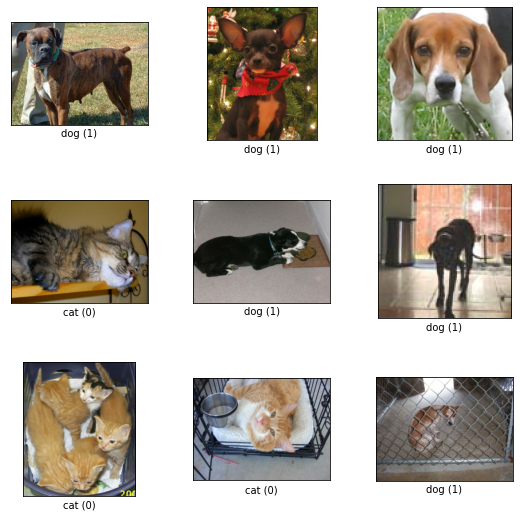

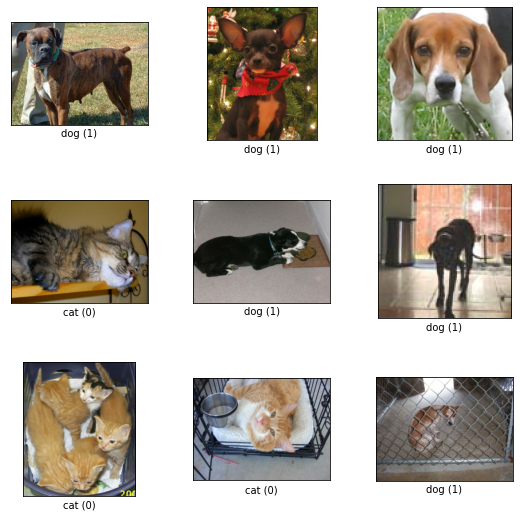

In [3]:
tfds.as_dataframe(datos['train'].take(5), metadatos)
tfds.show_examples(datos['train'], metadatos)

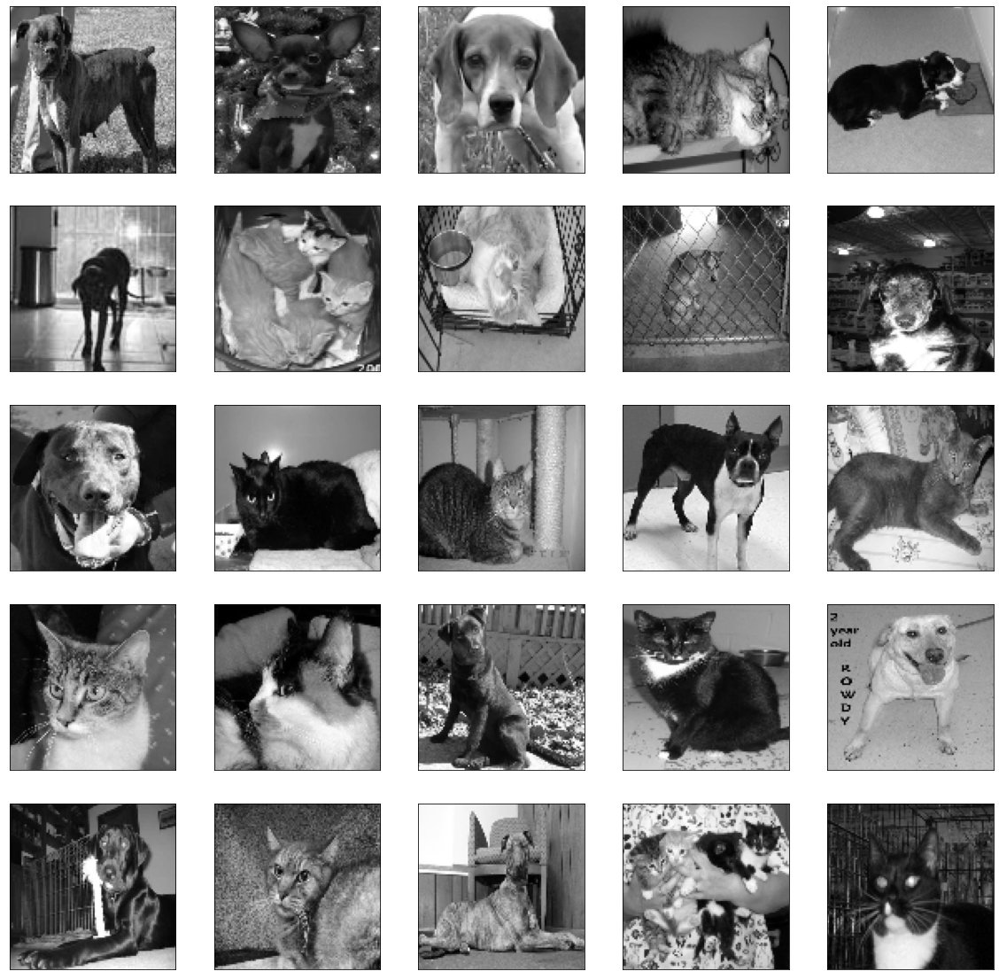

In [4]:
plt.figure(figsize=(20, 20))

TAMAÑO = 100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
    imagen = cv2.resize(imagen.numpy(), (TAMAÑO, TAMAÑO))
    imagen = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen, cmap='gray')

In [5]:
datos_entrenamiento = []

for i, (imagen, etiqueta) in enumerate(datos['train']):
    imagen = cv2.resize(imagen.numpy(), (TAMAÑO, TAMAÑO))
    imagen = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)
    imagen = imagen.reshape(TAMAÑO, TAMAÑO, 1)
    datos_entrenamiento.append([imagen, etiqueta])

In [6]:
x = []
y = []

for imagen, etiqueta in datos_entrenamiento:
    x.append(imagen)
    y.append(etiqueta)

In [7]:
x = np.array(x).astype(float) / 255
y = np.array(y)

In [8]:
modelo_denso = models.Sequential([
    layers.Flatten(input_shape=(100, 100, 1)),
    layers.Dense(150, activation='relu'),
    layers.Dense(150, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

modelo_cnn = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu',
                 input_shape=(100, 100, 1)),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    
    layers.Flatten(),
    layers.Dense(100, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

modelo_cnn2 = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu',
                 input_shape=(100, 100, 1)),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(250, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

In [9]:
modelo_denso.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])
modelo_cnn.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])
modelo_cnn2.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

In [10]:
tensorboard_denso = TensorBoard(log_dir='logs/denso')
modelo_denso.fit(x, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboard_denso])

Epoch 1/100
618/618 [==============================] - 5s 4ms/step - loss: 0.7118 - accuracy: 0.5496 - val_loss: 0.6897 - val_accuracy: 0.5871
Epoch 2/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6748 - accuracy: 0.5775 - val_loss: 0.6723 - val_accuracy: 0.5782
Epoch 3/100
618/618 [==============================] - 2s 4ms/step - loss: 0.6701 - accuracy: 0.5906 - val_loss: 0.6721 - val_accuracy: 0.5848
Epoch 4/100
618/618 [==============================] - 2s 4ms/step - loss: 0.6673 - accuracy: 0.5910 - val_loss: 0.6685 - val_accuracy: 0.5880
Epoch 5/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6622 - accuracy: 0.6000 - val_loss: 0.6716 - val_accuracy: 0.5825
Epoch 6/100
618/618 [==============================] - 2s 4ms/step - loss: 0.6615 - accuracy: 0.6005 - val_loss: 0.6696 - val_accuracy: 0.5923
Epoch 7/100
618/618 [==============================] - 2s 4ms/step - loss: 0.6595 - accuracy: 0.6063 - val_loss: 0.6708 - val_accuracy: 0.5951

In [11]:
%load_ext tensorboard

In [12]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [13]:
tensorboard_cnn = TensorBoard(log_dir='logs/cnn')
modelo_cnn.fit(x, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboard_cnn])

Epoch 1/100
618/618 [==============================] - 16s 15ms/step - loss: 0.6340 - accuracy: 0.6247 - val_loss: 0.5548 - val_accuracy: 0.7163
Epoch 2/100
618/618 [==============================] - 9s 14ms/step - loss: 0.4928 - accuracy: 0.7607 - val_loss: 0.5020 - val_accuracy: 0.7542
Epoch 3/100
618/618 [==============================] - 9s 15ms/step - loss: 0.4188 - accuracy: 0.8069 - val_loss: 0.3988 - val_accuracy: 0.8195
Epoch 4/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3592 - accuracy: 0.8401 - val_loss: 0.3685 - val_accuracy: 0.8344
Epoch 5/100
618/618 [==============================] - 10s 15ms/step - loss: 0.3008 - accuracy: 0.8696 - val_loss: 0.3688 - val_accuracy: 0.8395
Epoch 6/100
618/618 [==============================] - 9s 14ms/step - loss: 0.2422 - accuracy: 0.8968 - val_loss: 0.3816 - val_accuracy: 0.8390
Epoch 7/100
618/618 [==============================] - 9s 14ms/step - loss: 0.1797 - accuracy: 0.9269 - val_loss: 0.3876 - val_accurac

In [14]:
tensorboard_cnn2 = TensorBoard(log_dir='logs/cnn')
modelo_cnn2.fit(x, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboard_cnn2])

Epoch 1/100
618/618 [==============================] - 11s 16ms/step - loss: 0.6297 - accuracy: 0.6363 - val_loss: 0.5321 - val_accuracy: 0.7395
Epoch 2/100
618/618 [==============================] - 9s 15ms/step - loss: 0.5183 - accuracy: 0.7447 - val_loss: 0.4511 - val_accuracy: 0.7877
Epoch 3/100
618/618 [==============================] - 10s 16ms/step - loss: 0.4456 - accuracy: 0.7945 - val_loss: 0.4084 - val_accuracy: 0.8143
Epoch 4/100
618/618 [==============================] - 10s 16ms/step - loss: 0.3956 - accuracy: 0.8205 - val_loss: 0.4367 - val_accuracy: 0.7871
Epoch 5/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3594 - accuracy: 0.8390 - val_loss: 0.3460 - val_accuracy: 0.8473
Epoch 6/100
618/618 [==============================] - 10s 16ms/step - loss: 0.3234 - accuracy: 0.8585 - val_loss: 0.3332 - val_accuracy: 0.8562
Epoch 7/100
618/618 [==============================] - 10s 16ms/step - loss: 0.2905 - accuracy: 0.8741 - val_loss: 0.3282 - val_accu

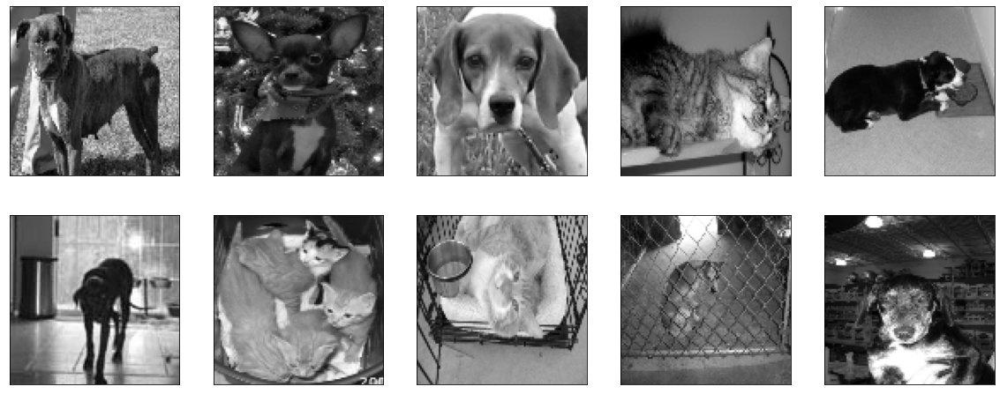

In [15]:
plt.figure(figsize=(20, 8))

for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(x[i].reshape(100, 100), cmap="gray")

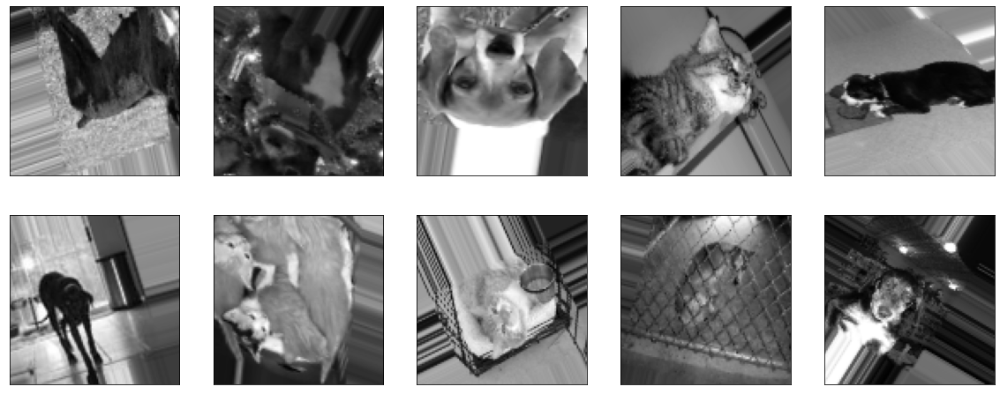

In [16]:
datagen = ImageDataGenerator(
    rotation_range=39,
    width_shift_range=.2,
    height_shift_range=.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)
datagen.fit(x)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(x, y, batch_size=10, shuffle=False):
    for i in range(10):
        plt.subplot(2, 5, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(imagen[i].reshape(100, 100), cmap="gray")
    break

In [17]:
modelo_denso_AD = models.Sequential([
    layers.Flatten(input_shape=(100, 100, 1)),
    layers.Dense(150, activation='relu'),
    layers.Dense(150, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

modelo_cnn_AD = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu',
                 input_shape=(100, 100, 1)),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    
    layers.Flatten(),
    layers.Dense(100, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

modelo_cnn2_AD = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu',
                 input_shape=(100, 100, 1)),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(250, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

In [18]:
modelo_denso_AD.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])
modelo_cnn_AD.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])
modelo_cnn2_AD.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

In [19]:
#len(x) * .80  # 18600
#len(x) - 18600  # 4662

x_entrenamiento = x[:18600]
x_validacion = x[18600:]

y_entrenamiento = y[:18600]
y_validacion = y[18600:]

In [20]:
data_gen_entrenamiento = datagen.flow(x_entrenamiento, y_entrenamiento, batch_size=32)

In [ ]:
tensorboard_denso_AD = TensorBoard(log_dir='logs/densoAD')

modelo_denso_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(x_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(x_entrenamiento) / 32.0)),
    validation_steps=int(np.ceil(len(x_validacion) / 32.0)),
    callbacks=[tensorboard_denso_AD]
 )

Epoch 1/100
582/582 [==============================] - 18s 31ms/step - loss: 0.7434 - accuracy: 0.5025 - val_loss: 0.6901 - val_accuracy: 0.5393
Epoch 2/100
582/582 [==============================] - 18s 31ms/step - loss: 0.6939 - accuracy: 0.5087 - val_loss: 0.6941 - val_accuracy: 0.4599
Epoch 3/100
582/582 [==============================] - 17s 30ms/step - loss: 0.6930 - accuracy: 0.5002 - val_loss: 0.6842 - val_accuracy: 0.5549
Epoch 4/100
582/582 [==============================] - 18s 30ms/step - loss: 0.6937 - accuracy: 0.5078 - val_loss: 0.6933 - val_accuracy: 0.4959
Epoch 5/100
582/582 [==============================] - 18s 30ms/step - loss: 0.6932 - accuracy: 0.5003 - val_loss: 0.6931 - val_accuracy: 0.4966
Epoch 6/100
582/582 [==============================] - 18s 30ms/step - loss: 0.6932 - accuracy: 0.4968 - val_loss: 0.6932 - val_accuracy: 0.4961
Epoch 7/100
582/582 [==============================] - 18s 30ms/step - loss: 0.6932 - accuracy: 0.5018 - val_loss: 0.6919 - val_ac

In [ ]:
tensorboard_cnn_AD = TensorBoard(log_dir='logs/cnnAD')

modelo_cnn_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(x_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(x_entrenamiento) / 32.0)),
    validation_steps=int(np.ceil(len(x_validacion) / 32.0)),
    callbacks=[tensorboard_cnn_AD]
)